In [1]:
%pip install kaggle

!kaggle competitions download -c fathomnet-out-of-sample-detection

%pip install matplotlib
%pip install scikit-learn

%pip install tensorflow
%pip install tensorflow_ranking

Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.
 77%|█████████████████████████████▎        | 1.00M/1.30M [00:00<00:00, 2.16MB/s]
100%|██████████████████████████████████████| 1.30M/1.30M [00:00<00:00, 2.67MB/s]
Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.
Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.
Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.
Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


In [2]:
import zipfile

zip_path = '/home/uceehuf/fathomnet-out-of-sample-detection.zip'

extract_to = '/home/uceehuf/.kaggle/'

# Open the ZIP file
with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    # Extract all the contents into the specified directory
    zip_ref.extractall(extract_to)



In [3]:
import pandas as pd
import os
import json
import numpy as np
import matplotlib.pyplot as plt
from collections import defaultdict
from tqdm import tqdm
from PIL import Image
import requests
from io import BytesIO
import shutil

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MultiLabelBinarizer

import tensorflow as tf
import tensorflow_ranking as tfr

2024-03-31 18:04:46.745969: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-03-31 18:04:46.746017: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-03-31 18:04:46.747145: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-03-31 18:04:46.752907: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-03-31 18:04:48.150991: W tensorflow/compiler/tf2

In [4]:
DATA_DIR = extract_to

In [5]:
# loading data and pre-processnig
# reading category keys from .csv file
category_key = pd.read_csv(os.path.join(DATA_DIR, 'category_key.csv'))

#converting categorial labels to numerical ones
category_key['supercat_label'] = category_key['supercat'].astype('category').cat.codes

# creating look up table for super categories
supercat_label_per_category_id = {row['id']: row['supercat_label'] for _, row in category_key.iterrows()}

# reading train labels
train_csv = pd.read_csv(os.path.join(DATA_DIR, 'multilabel_classification', 'train.csv'))

# loading as integer columns

train_csv.categories = train_csv.categories.apply(lambda x: list(map(int, json.loads(x))))

train_csv['supercats'] = train_csv.categories.apply(
    lambda x: list(set([supercat_label_per_category_id[category_id] for category_id in x])))
# train_csv.head()


# reading train data; images are represented in coco urls
with open(os.path.join(DATA_DIR, 'object_detection', 'train.json')) as f:
    train_json = json.load(f)
train_json_images = pd.json_normalize(train_json['images'])

# dropping unwanted columns
train_json_images.drop(['license','flickr_url','id'], axis=1, inplace=True)

# setting up id as the file name
train_json_images['id'] = train_json_images.file_name.apply(lambda x: x.split('.png')[0])

# dropping filename column
train_json_images.drop(['file_name'], axis=1, inplace=True)

# concatenating data
train_data = train_json_images.merge(right=train_csv, how='left', left_on='id', right_on='id')
train_data.head()

,width,height,coco_url,date_captured,id,categories,supercats
0,720,368,https://fathomnet.org/static/m3/framegrabs/Tib...,2007-08-17 17:50:34,3b6f01ae-5bde-434d-9b06-79b269421ed6,[1],[0]
1,720,368,https://fathomnet.org/static/m3/framegrabs/Tib...,2007-08-17 17:50:38,dce21f7c-20e5-482b-bd90-c038f8464c03,[1],[0]
2,720,368,https://fathomnet.org/static/m3/framegrabs/Tib...,2007-08-17 17:50:44,4a7f2199-772d-486d-b8e2-b651246316b5,[1],[0]
3,720,368,https://fathomnet.org/static/m3/framegrabs/Ven...,2007-08-28 17:54:14,3bddedf6-4ff8-4e81-876a-564d2b03b364,"[1, 9, 11, 88]","[0, 13, 6]"
4,720,369,https://fathomnet.org/static/m3/framegrabs/Ven...,2007-08-28 19:00:00,3f735021-f5de-4168-b139-74bf2859d12a,"[1, 37, 51, 119]","[0, 13, 6]"


/tmp/ipykernel_1164772/3639086165.py:2: FutureWarning: pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.
  num_samples_per_category = pd.value_counts(np.concatenate(train_data.categories))


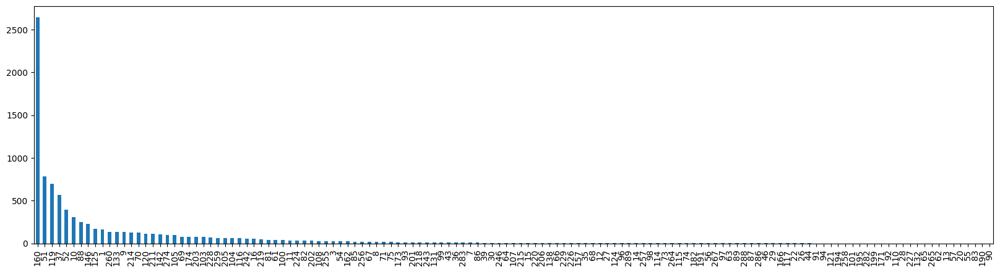

In [6]:
# looking into category distribution
num_samples_per_category = pd.value_counts(np.concatenate(train_data.categories))

plt.figure(figsize=(20, 5))
num_samples_per_category.plot(kind='bar')
plt.show()

/tmp/ipykernel_1164772/1839315261.py:8: FutureWarning: pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.
  num_samples_per_category = pd.value_counts(np.concatenate(train_data.categories))


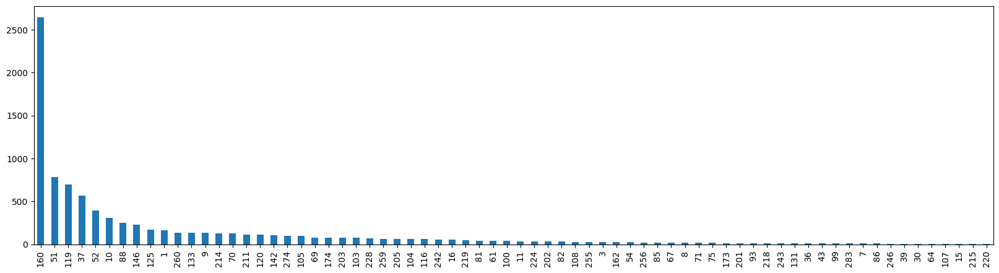

70 categories presented more than 5 times


In [7]:
# remove categories that doesn't appear frequently as they won't help with training

underrepresented_categories = list(num_samples_per_category[num_samples_per_category < 6].index)

train_data.categories = train_data.categories.apply(
    lambda categs: [x for x in categs if x not in underrepresented_categories])

num_samples_per_category = pd.value_counts(np.concatenate(train_data.categories))
num_samples_per_category.index = np.array(num_samples_per_category.index, dtype=int)

plt.figure(figsize=(20, 5))
num_samples_per_category.plot(kind='bar')
plt.show()

print(f'{len(num_samples_per_category)} categories presented more than 5 times')

/tmp/ipykernel_1164772/705267800.py:2: FutureWarning: pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.
  num_samples_per_supercat = pd.value_counts(np.concatenate(train_data.supercats))


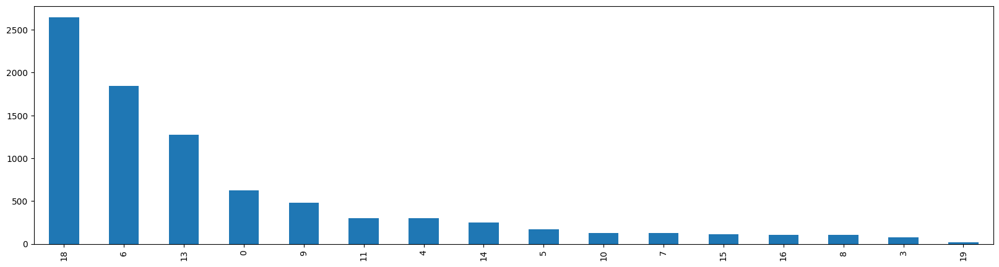

19 samples in the least frequently found supercats


In [8]:
# Similar for superccats
num_samples_per_supercat = pd.value_counts(np.concatenate(train_data.supercats))

plt.figure(figsize=(20, 5))
num_samples_per_supercat.plot(kind='bar')
plt.show()

print(f'{min(num_samples_per_supercat)} samples in the least frequently found supercats')

100%|██████████| 16/16 [01:41<00:00,  6.37s/it]


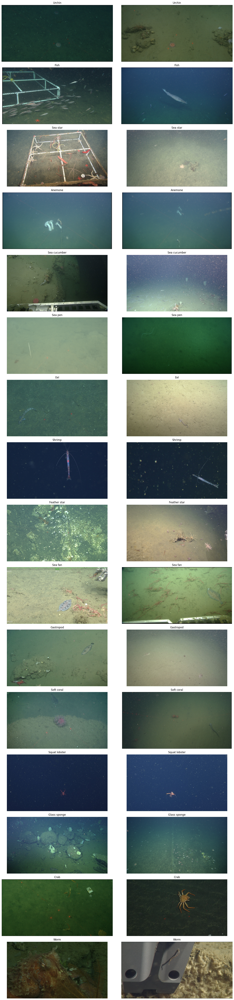

In [9]:


supercat_label2name = dict()
for supercat_label in num_samples_per_supercat.keys():
    supercat_name = category_key.supercat.to_numpy()[
        category_key.index[category_key['supercat_label'] == supercat_label]][0]
    supercat_label2name[supercat_label] = supercat_name

img_per_supercat = defaultdict(list)
for supercat_label, supercat_name in tqdm(supercat_label2name.items()):
    train_samples = train_data[train_data.supercats.apply(lambda x: supercat_label in x and len(x) == 1)]
    for _, row in train_samples.sample(n=2, random_state=10219).iterrows():
        image = Image.open(BytesIO(requests.get(row['coco_url']).content))
        img_per_supercat[supercat_name].append(np.array(image, dtype='uint8'))

fig, axs = plt.subplots(nrows=len(img_per_supercat), ncols=2,
                        figsize=(16, 4 * len(img_per_supercat)))
for i, (supercat_name, images) in enumerate(img_per_supercat.items()):
    for j, image in enumerate(images):
        axs[i][j].imshow(image)
        axs[i][j].set_title(supercat_name)
        axs[i][j].axis("off")
fig.tight_layout()
fig.show()

In [11]:
# Test data
with open(os.path.join(DATA_DIR, 'object_detection', 'eval.json')) as f:
    test_json = json.load(f)

test_data = pd.json_normalize(test_json['images'])
test_data.drop(['license','flickr_url','id'], axis=1, inplace=True)
test_data['id'] = test_data.file_name.apply(lambda x: x.split('.png')[0])
test_data.drop(['file_name'], axis=1, inplace=True)
test_data.head()

,width,height,coco_url,date_captured,id
0,1920,1079,https://fathomnet.org/static/m3/framegrabs/Min...,2019-09-24 12:11:05,4172b65a-8b4f-4175-94e4-00187e2d5f33
1,713,425,https://fathomnet.org/static/m3/framegrabs/Ven...,2007-08-15 18:44:36,9d263fd4-f786-42bf-8e0c-2d5be7c81b49
2,720,368,https://fathomnet.org/static/m3/framegrabs/Tib...,2007-09-08 14:41:18,c114ccb9-cf89-4d98-807b-f8636477c6ca
3,718,365,https://fathomnet.org/static/m3/framegrabs/Ven...,2007-11-07 18:52:01,95ba3acc-859b-4a99-8c30-b38a91a1be28
4,720,368,https://fathomnet.org/static/m3/framegrabs/Ven...,2007-12-06 20:00:00,0c4bdb90-c715-4c01-81d1-aa7f49534ac7


In [17]:
test_data = test_data.sample(n = 1000,random_state=25)

In [6]:

#spliting training and validation set
train_data, val_data = train_test_split(train_data, test_size=0.2, shuffle=True, random_state=42)

# convert category labels to binary series
categories_encoder = MultiLabelBinarizer().fit(train_data.categories)
encode_sample_categories = lambda x: categories_encoder.transform([x])[0]

supercats_encoder = MultiLabelBinarizer().fit(train_data.supercats)
encode_sample_supercats = lambda x: supercats_encoder.transform([x])[0]

# applying
train_data.categories = train_data.categories.apply(encode_sample_categories)
train_data.supercats = train_data.supercats.apply(encode_sample_supercats)
val_data.categories = val_data.categories.apply(encode_sample_categories)
val_data.supercats = val_data.supercats.apply(encode_sample_supercats)


/home/uceehuf/.local/lib/python3.11/site-packages/sklearn/preprocessing/_label.py:900: UserWarning: unknown class(es) [190] will be ignored
  warnings.warn(
/home/uceehuf/.local/lib/python3.11/site-packages/sklearn/preprocessing/_label.py:900: UserWarning: unknown class(es) [258] will be ignored
  warnings.warn(
/home/uceehuf/.local/lib/python3.11/site-packages/sklearn/preprocessing/_label.py:900: UserWarning: unknown class(es) [171] will be ignored
  warnings.warn(
/home/uceehuf/.local/lib/python3.11/site-packages/sklearn/preprocessing/_label.py:900: UserWarning: unknown class(es) [28] will be ignored
  warnings.warn(
/home/uceehuf/.local/lib/python3.11/site-packages/sklearn/preprocessing/_label.py:900: UserWarning: unknown class(es) [55] will be ignored
  warnings.warn(


In [8]:
target_image_size = (224, 224)

def make_tfrecords(data_frame: pd.DataFrame, tfrecords_dir: str, is_data_labeled: bool,
                   override_existing_tfrecords=False):
    if os.path.exists(tfrecords_dir):
        if override_existing_tfrecords:
            shutil.rmtree(tfrecords_dir)
        else:
            raise FileExistsError('tfrecords are already created;'
                                  'to override existing files set `override_existing_tfrecords=True`')
    os.makedirs(tfrecords_dir)

    data_buffer = []
    num_samples_per_file = 500
    num_tfrecords_saved = 0
    for i, (index, row) in tqdm(enumerate(data_frame.iterrows())):
        sample = dict()
        sample['id'] = tf.compat.as_bytes(row['id'])

        image_url = row['coco_url']
        image = Image.open(BytesIO(requests.get(image_url).content))
        image = image.resize(target_image_size)
        sample['image'] = tf.image.encode_png(np.array(image, dtype='uint8')).numpy()
        if is_data_labeled:
            sample['categories'] = np.array(row['categories'], dtype=np.float32)
            sample['supercats'] = np.array(row['supercats'], dtype=np.float32)
        data_buffer.append(sample)

        if len(data_buffer) == num_samples_per_file or i == (len(data_frame) - 1):
            tfrecord_outpath = os.path.join(tfrecords_dir, f'{num_tfrecords_saved:03d}.tfrecord')
            print(tfrecord_outpath)

            with tf.io.TFRecordWriter(tfrecord_outpath) as tfrecord_writer:
                for sample in data_buffer:
                    feature=dict(
                        image=tf.train.Feature(bytes_list=tf.train.BytesList(value=[sample['image']])),
                        id=tf.train.Feature(bytes_list=tf.train.BytesList(value=[sample['id']]))
                    )
                    if is_data_labeled:
                        feature.update(dict(
                            categories=tf.train.Feature(float_list=tf.train.FloatList(value=sample['categories'])),
                            supercats=tf.train.Feature(float_list=tf.train.FloatList(value=sample['supercats'])),
                        ))
                    record_bytes = tf.train.Example(features=tf.train.Features(feature=feature)).SerializeToString()
                    tfrecord_writer.write(record_bytes)

            num_tfrecords_saved += 1
            data_buffer = []  # reset data buffer

In [14]:
train_tfrecords_dir = os.path.join(extract_to, 'data', 'train')
# if os.path.isdir(train_tfrecords_dir):
#     print('train data already exist, skip creating tfrecord data')
# else:
make_tfrecords(train_data, train_tfrecords_dir, is_data_labeled=True)

500it [18:01,  2.04s/it]

/home/uceehuf/.kaggle/data/train/000.tfrecord


1000it [36:36,  2.90s/it]

/home/uceehuf/.kaggle/data/train/001.tfrecord


1500it [54:27,  1.97s/it]

/home/uceehuf/.kaggle/data/train/002.tfrecord


2000it [1:14:33,  3.35s/it]

/home/uceehuf/.kaggle/data/train/003.tfrecord


2500it [1:34:32,  3.08s/it]

/home/uceehuf/.kaggle/data/train/004.tfrecord


3000it [1:52:34,  1.71s/it]

/home/uceehuf/.kaggle/data/train/005.tfrecord


3500it [2:09:46,  2.00s/it]

/home/uceehuf/.kaggle/data/train/006.tfrecord


4000it [2:25:01,  1.63s/it]

/home/uceehuf/.kaggle/data/train/007.tfrecord


4500it [2:39:57,  1.69s/it]

/home/uceehuf/.kaggle/data/train/008.tfrecord


4760it [2:47:44,  2.11s/it]

/home/uceehuf/.kaggle/data/train/009.tfrecord


In [9]:
val_tfrecords_dir = os.path.join(extract_to, 'data', 'validation')
# if os.path.isdir(val_tfrecords_dir):
#     print('validation data already exist, skip creating tfrecord data')
# else:
make_tfrecords(val_data, val_tfrecords_dir, is_data_labeled=True)

0it [00:00, ?it/s]2024-03-31 18:05:35.847431: W tensorflow/core/common_runtime/gpu/gpu_bfc_allocator.cc:47] Overriding orig_value setting because the TF_FORCE_GPU_ALLOW_GROWTH environment variable is set. Original config value was 0.
2024-03-31 18:05:35.848774: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1929] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 79086 MB memory:  -> device: 0, name: NVIDIA A100-SXM4-80GB, pci bus id: 0000:01:00.0, compute capability: 8.0
2024-03-31 18:05:35.849061: W tensorflow/core/common_runtime/gpu/gpu_bfc_allocator.cc:47] Overriding orig_value setting because the TF_FORCE_GPU_ALLOW_GROWTH environment variable is set. Original config value was 0.
2024-03-31 18:05:35.850394: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1929] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 79086 MB memory:  -> device: 1, name: NVIDIA A100-SXM4-80GB, pci bus id: 0000:41:00.0, compute capability: 8.0
2024-03-31 18:05:35.850707: 

/home/uceehuf/.kaggle/data/validation/000.tfrecord


1000it [47:35,  3.53s/it]

/home/uceehuf/.kaggle/data/validation/001.tfrecord


1190it [54:52,  2.77s/it]

/home/uceehuf/.kaggle/data/validation/002.tfrecord


In [19]:
eval_tfrecords_dir = os.path.join(extract_to, 'data', 'evaluation')

make_tfrecords(test_data, eval_tfrecords_dir, is_data_labeled=False,override_existing_tfrecords=True)

500it [40:28,  4.85s/it]

/home/uceehuf/.kaggle/data/evaluation/000.tfrecord


1000it [1:05:00,  3.90s/it]

/home/uceehuf/.kaggle/data/evaluation/001.tfrecord
